In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# datasets
from diffusion_curvature.datasets import sphere, torus

import os
os.environ["GEOMSTATS_BACKEND"] = "pytorch"

# models
import torch
from autometric.autoencoders import DerrickTheAutoencoder

# 
%load_ext autoreload
%autoreload 2

# 3a Autometrics of the Sphere and Torus
> The minimum viable experiment

Here we test the capabilities of the decoder-extracted pullback metric with the simplest possible case: the 2torus. Or is it 2-torus? The TWO sphere? Toü, the sphere?

Toü is defined by her uniformity. The sphere has constant curvature, a constant metric -- it should *look the same* from any point in the embedding. Meanwhile, the embedding has to do a lot of work to create this uniformity. Some parts need only be cupped gently, but the edges of the embedding space need to be wrapped entirely around.

I anticipate two challenges to a successful autometric:

1. Autoencoders never achieve perfect reconstruction loss. The pullback metric of the decoder will be flawed. How much so? That remains to be seen.
2. The sphere cannot really be embedded in 2D space. At best, one can embed everything except the poles and perhaps a line running between them.

The *hypothesis*: the autometric recovers the true Riemannian metric of over 95% of the sphere.

This will be tested by:

1. Visualizing the curvature over the embedding space.
2. Checking the metric tensor at different points.

# Dataset Setup

In [ ]:
# A pytorch dataset subclass that takes a pointcloud as input, and, for each idx, returns the corresponding point

class PointcloudDataset(torch.utils.data.Dataset):
    def __init__(self, pointcloud):
        self.pointcloud = torch.tensor(pointcloud, dtype=torch.float32)
        
    def __len__(self):
        return len(self.pointcloud)
    
    def __getitem__(self, idx):
        return self.pointcloud[idx]
# Load the sphere dataset and create a trainloader and testloader

X_sphere, ks_sphere = sphere(n=10000)
X_train = X_sphere[:8000]
X_val = X_sphere[8000:9000]
X_test = X_sphere[9000:]
train_dataset = PointcloudDataset(X_train)
val_dataset = PointcloudDataset(X_val)
test_dataset = PointcloudDataset(X_test)
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
valloader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=True)
testloader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=True)

# The Pristine Sphere
No noise, no complications - just a pristine sphere ready to be pristinely embedded.

## Training

In [ ]:
# instantiate a pytorch lightning trainer and train DerrickTheAutoencoder on the sphere dataset
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import EarlyStopping

early_stopping = EarlyStopping('val_loss', patience=500)
trainer = Trainer(max_epochs=1000, 
                #   accelerator='cuda',
                  callbacks=[early_stopping])
model = DerrickTheAutoencoder(input_dim=3, intrinsic_dimension=2)
# check if model alreaady exists at ../data/sphere_encoder.pt - if so, load it
if os.path.exists('../data/sphere_encoder.pt'):
    model.load_state_dict(torch.load('../data/sphere_encoder.pt'))
else:
    trainer.fit(
        model=model,
        train_dataloaders=trainloader,
        val_dataloaders=valloader
    )

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/piriac/mambaforge/envs/geometric-ae/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/logger_connector/logger_connector.py:67: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default


In [ ]:
# save model to disk
torch.save(model.state_dict(), '../data/sphere_encoder.pt')

In [ ]:
sphere_encoded_then_decoded = model.decoder(model.encoder(torch.tensor(X_sphere, dtype=torch.float32))).detach().numpy()

In [ ]:
from diffusion_curvature.utils import plot_3d
plot_3d(sphere_encoded_then_decoded, use_plotly=True)

Huzzah! It appears our model has learned a perfect reconstruction of the sphere. What does the embeddings space look like?

In [ ]:
sphere_embedding = model.encoder(torch.tensor(X_sphere, dtype=torch.float32)).detach().numpy()

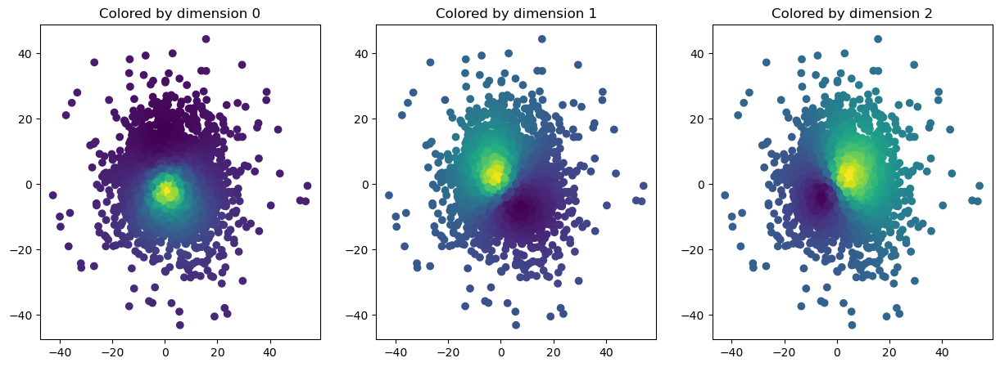

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
for i in range(3):
    axs[i].scatter(sphere_embedding[:, 0], sphere_embedding[:, 1], c=X_sphere[:, i], cmap='viridis')
    axs[i].set_title(f'Colored by dimension {i}')

In [ ]:
sphere_embedding = torch.tensor(sphere_embedding)

This is a deeply unintuitive embedding scheme. I expected something like a mercador projection of the sphere; instead, the model has learned three different views of this 2D circle, which allow it to reconstruct the 3D info perfectly. The y and z dimensions appear to be represented by the shell of a circle that begins on one side of the embedding and expands to encompass the other. The x dimension begins similarly, but then shrinks down. Imagine a ring centered at the deep blue region which slowly expands and then moves into the yellow region where it contracts; the time at which that ring contained each point is a proxy for $x$.

## Metric Analysis

In [ ]:
X_sphere = torch.tensor(X_sphere, dtype=torch.float32)

In [ ]:
import os
from autometric.metrics import PullbackMetric
from autometric.connections import LeviCivitaConnection
from autometric.manifolds import RiemannianManifold
pbm = PullbackMetric(2, model.immersion)
lcc = LeviCivitaConnection(2, pbm)
sphere_manifold = RiemannianManifold(2, (1, 1), metric=pbm, connection=lcc)

INFO: Using pytorch backend


In [ ]:
pbm.metric_matrix(base_point = torch.tensor(sphere_embedding)[0])

/tmp/ipykernel_1883077/3613122597.py:1: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).

/home/piriac/mambaforge/envs/geometric-ae/lib/python3.11/site-packages/torch/_functorch/deprecated.py:88: UserWarning:

We've integrated functorch into PyTorch. As the final step of the integration, functorch.jacfwd is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use torch.func.jacfwd instead; see the PyTorch 2.0 release notes and/or the torch.func migration guide for more details https://pytorch.org/docs/master/func.migrating.html



tensor([[0.0746, 0.0050],
        [0.0050, 0.0635]], grad_fn=<MmBackward0>)

In [ ]:
s = sphere_manifold.k_scalar_curvature(base_point = torch.tensor(sphere_embedding)[65])
s

/tmp/ipykernel_1883077/3414621555.py:1: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



tensor(1.6129, grad_fn=<ViewBackward0>)

In [ ]:
scalar_curvatures = [sphere_manifold.k_scalar_curvature(base_point = torch.tensor(sphere_embedding)[i]) for i in range(len(sphere_embedding))]

/tmp/ipykernel_1883077/3229255435.py:1: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



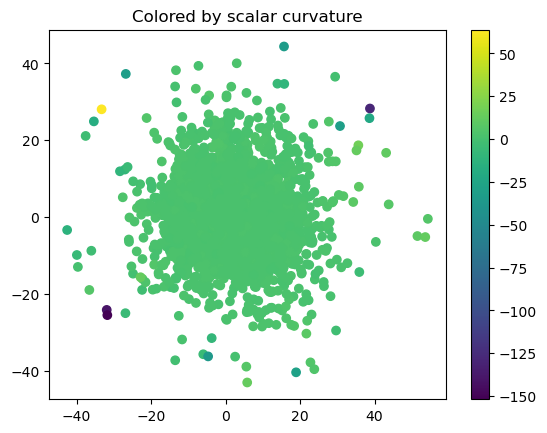

In [ ]:
fig, ax = plt.subplots()
scalar_curvatures = torch.tensor(scalar_curvatures).detach().numpy()
ax.scatter(sphere_embedding[:, 0], sphere_embedding[:, 1], c=scalar_curvatures, cmap='viridis')
ax.set_title('Colored by scalar curvature')
# add colorbar
cbar = fig.colorbar(ax.collections[0], ax=ax)

Let's visualize the entire embedding space with this curvature heatmat.

In [ ]:
import numpy as np
# make a 2d grid ranging from -50 to 50 in each dimension
x = np.linspace(-50, 50, 100)
y = np.linspace(-50, 50, 100)
xx, yy = np.meshgrid(x, y)
# flatten the grid to a list of (x, y) points
xx_flat = xx.flatten()
yy_flat = yy.flatten()
grid = np.vstack((xx_flat, yy_flat)).T
grid = torch.tensor(grid, dtype=torch.float32)

In [ ]:
scalar_curvatures_of_grid = [sphere_manifold.k_scalar_curvature(base_point = torch.tensor(grid)[i]) for i in range(len(grid))]

/tmp/ipykernel_1883077/1949048617.py:1: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



In [ ]:
scalar_curvatures_of_grid = torch.tensor(scalar_curvatures_of_grid).detach().numpy()

In [ ]:
# a 2d plotly plot of the scalar curvature of the sphere
import plotly.graph_objects as go
fig = go.Figure(data=[go.Surface(z=scalar_curvatures_of_grid.reshape(100, 100))])
fig.update_layout(title='Scalar Curvature of the Sphere', autosize=False,
                    width=500, height=500,
                    margin=dict(l=65, r=50, b=65, t=90))
fig.show()

The spikes are a little surprising; they must correspond to discontinuities in the decoder, and could furnish an interesting tool for analyzing the fidelity of training. Spiky training is not to be trusted.

When plotting these values in the reconstructed embedding, we see all of these discontinuities concentrated in one region of the sphere.

In [ ]:
plot_3d(
    model.decoder(sphere_embedding).detach().numpy(),
    scalar_curvatures,
    use_plotly=True
)

# Torus

Here's a more challenging dataset.

In [ ]:

X_torus, ks_torus = torus(n=10000)
X_train = X_torus[:8000]
X_val = X_torus[8000:9000]
X_test = X_torus[9000:]
train_dataset = PointcloudDataset(X_train)
val_dataset = PointcloudDataset(X_val)
test_dataset = PointcloudDataset(X_test)
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
valloader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=True)
testloader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=True)

## Embedding the Torus

In [ ]:
# instantiate a pytorch lightning trainer and train DerrickTheAutoencoder on the sphere dataset
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import EarlyStopping

early_stopping = EarlyStopping('val_loss', patience=500)
trainer = Trainer(max_epochs=1000, 
                #   accelerator='cuda',
                  callbacks=[early_stopping])
model = DerrickTheAutoencoder(input_dim=3, intrinsic_dimension=2)
# check if model alreaady exists at ../data/torus_encoder.pt - if so, load it
if os.path.exists('../data/torus_encoder.pt'):
    model.load_state_dict(torch.load('../data/torus_encoder.pt'))
else:
    trainer.fit(
        model=model,
        train_dataloaders=trainloader,
        val_dataloaders=valloader
    )

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [ ]:
# save model to disk
torch.save(model.state_dict(), '../data/torus_encoder.pt')

In [ ]:
torus_encoded_then_decoded = model.decoder(model.encoder(torch.tensor(X_torus, dtype=torch.float32))).detach().numpy()

In [ ]:
from diffusion_curvature.utils import plot_3d
plot_3d(torus_encoded_then_decoded, use_plotly=True)

In [ ]:
torus_embedding = model.encoder(torch.tensor(X_torus, dtype=torch.float32)).detach().numpy()

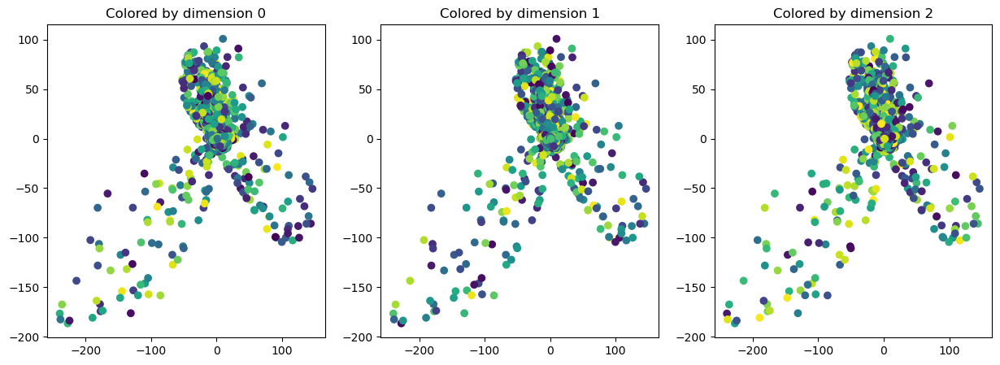

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
for i in range(3):
    axs[i].scatter(torus_embedding[:, 0], torus_embedding[:, 1], c=X_sphere[:, i], cmap='viridis')
    axs[i].set_title(f'Colored by dimension {i}')

In [ ]:
torus_embedding = torch.tensor(torus_embedding)

Oh, autoencoder, what strange embedding have you learned?
Nonetheless, it seems to work.

## Metric Analysis

In [ ]:
X_torus = torch.tensor(X_torus, dtype=torch.float32)

In [ ]:
import os
from autometric.metrics import PullbackMetric
from autometric.connections import LeviCivitaConnection
from autometric.manifolds import RiemannianManifold
pbm = PullbackMetric(2, model.immersion)
lcc = LeviCivitaConnection(2, pbm)
torus_manifold = RiemannianManifold(2, (1, 1), metric=pbm, connection=lcc)

In [ ]:
pbm.metric_matrix(base_point = torch.tensor(torus_embedding)[0])

/tmp/ipykernel_1883077/3717255097.py:1: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).

/home/piriac/mambaforge/envs/geometric-ae/lib/python3.11/site-packages/torch/_functorch/deprecated.py:88: UserWarning:

We've integrated functorch into PyTorch. As the final step of the integration, functorch.jacfwd is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use torch.func.jacfwd instead; see the PyTorch 2.0 release notes and/or the torch.func migration guide for more details https://pytorch.org/docs/master/func.migrating.html



tensor([[0.0208, 0.0023],
        [0.0023, 0.0006]], grad_fn=<MmBackward0>)

In [ ]:
s = torus_manifold.k_scalar_curvature(base_point = torch.tensor(torus_embedding)[65])
s

/tmp/ipykernel_1883077/3778059704.py:1: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



tensor(-0.4817, grad_fn=<ViewBackward0>)

In [ ]:
scalar_curvatures = [torus_manifold.k_scalar_curvature(base_point = torch.tensor(torus_embedding)[i]) for i in range(len(torus_embedding))]

/tmp/ipykernel_1883077/2419540527.py:1: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



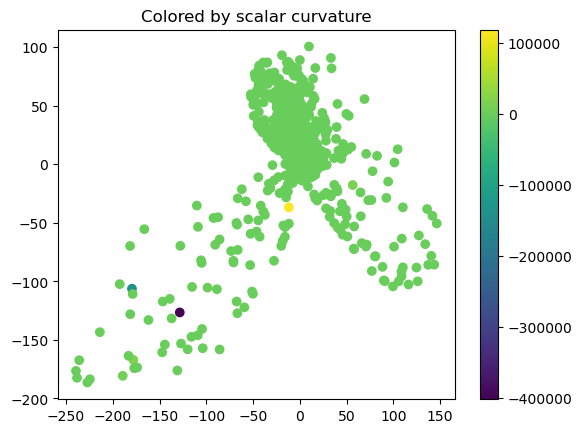

In [ ]:
fig, ax = plt.subplots()
scalar_curvatures = torch.tensor(scalar_curvatures).detach().numpy()
ax.scatter(torus_embedding[:, 0], torus_embedding[:, 1], c=scalar_curvatures, cmap='viridis')
ax.set_title('Colored by scalar curvature')
# add colorbar
cbar = fig.colorbar(ax.collections[0], ax=ax)

Let's visualize the entire embedding space with this curvature heatmat.

In [ ]:
import numpy as np
# make a 2d grid ranging from -50 to 50 in each dimension
x = np.linspace(-50, 50, 100)
y = np.linspace(-50, 50, 100)
xx, yy = np.meshgrid(x, y)
# flatten the grid to a list of (x, y) points
xx_flat = xx.flatten()
yy_flat = yy.flatten()
grid = np.vstack((xx_flat, yy_flat)).T
grid = torch.tensor(grid, dtype=torch.float32)

In [ ]:
scalar_curvatures_of_grid = [torus_manifold.k_scalar_curvature(base_point = torch.tensor(grid)[i]) for i in range(len(grid))]

/tmp/ipykernel_1883077/119493322.py:1: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



In [ ]:
scalar_curvatures_of_grid = torch.tensor(scalar_curvatures_of_grid).detach().numpy()

In [ ]:
# a 2d plotly plot of the scalar curvature of the torus
import plotly.graph_objects as go
fig = go.Figure(data=[go.Surface(z=np.array(scalar_curvatures_of_grid).reshape(100, 100))])
fig.update_layout(title='Scalar Curvature of the Torus', autosize=False,
                    width=500, height=500,
                    margin=dict(l=65, r=50, b=65, t=90))
fig.show()

Because of the spikes, we have to take out the outliers before plotting it on the torus.

In [ ]:
scalar_curvatures_normalized = torch.tensor(scalar_curvatures).clone().detach().numpy()
scalar_curvatures_normalized[scalar_curvatures>5] = 5
scalar_curvatures_normalized[scalar_curvatures<-5] = -5

In [ ]:
plot_3d(
    model.decoder(torus_embedding).detach().numpy(),
    scalar_curvatures_normalized,
    use_plotly=True
)